Sofia Alvarez Sandoval - A01656059

# Módulo 3 Actividad 1 - Rips, Cech, Alpha

#### Librerías utilizadas

In [49]:
import numpy as np                                      # uso de arreglos
import pandas as pd                                     # trabajo con bases de datos
import matplotlib.pyplot as plt                         # graficar
from scipy.spatial.distance import squareform, pdist    # calcular matrices de distancias 
import matplotlib.patches as mpatches                   # hacer elipses
from matplotlib.collections import PatchCollection      # hacer elipses
import gudhi                                            # filtracion de complejos simpliciales de Rips y Alpha

### Lectura de datos

In [50]:
data1_np = np.loadtxt('Activity1.csv', delimiter=',',dtype=float)[1:]
data2_np = np.loadtxt('Activity2.csv', delimiter=',',dtype=float)[1:]
data3_np = np.loadtxt('Activity3.csv', delimiter=',',dtype=float)[1:]

### Función para graficar complejos de Rips

In [51]:
def plot_rips_complex(data, R, label=" data" , col=1 , maxdim=2):
    tab10 = plt.get_cmap('tab10')
    
    fig, ax = plt.subplots(figsize =(6,6))
    ax.set_title(label)
    ax.scatter(
        data [:,0], data[:,1], label=label,
        s=8, alpha=0.9, c=np.array(tab10([col] * len(data)))
    )

    for xy in data:
        ax.add_patch(mpatches.Circle(xy, radius = R, fc = 'none', ec = tab10(col), alpha = 0.2))
    
    for i , xy in enumerate(data):
        if maxdim >= 1:
            for j in range(i + 1, len(data)):
                pq = data[j]
                if (xy != pq) . all() and (np.linalg.norm(xy - pq) <= R):
                    pts = np.array([xy ,pq])
                    ax.plot(pts[:,0], pts[:,1], color=tab10(col), alpha=0.6, linewidth=1)
                if maxdim == 2:
                    for k in range (j + 1 ,len(data)):
                        ab = data[k]
                        if((ab != pq) . all () 
                            and (np.linalg.norm(xy - pq) <= R) 
                            and (np.linalg.norm(xy - ab) <= R)
                            and (np.linalg.norm(pq - ab) <= R)
                        ):
                            pts = np.array([xy, pq, ab])
                            ax.fill(pts[:,0], pts[:,1], facecolor=tab10(col), alpha=0.1)
                        pass
    plt.axis('equal')
    plt.tight_layout()
    plt.show()
    pass

## Base de datos 1

In [52]:
point_list = []
x = []
y = []

for n in range(len(data1_np)):
    point_list.append(('P' + str(n+1)))
    x.append(data1_np[n,0])
    y.append(data1_np[n,1])

data1 = pd.DataFrame({'Point': point_list, 'x':x, 'y':y})
data1 = data1.set_index('Point')

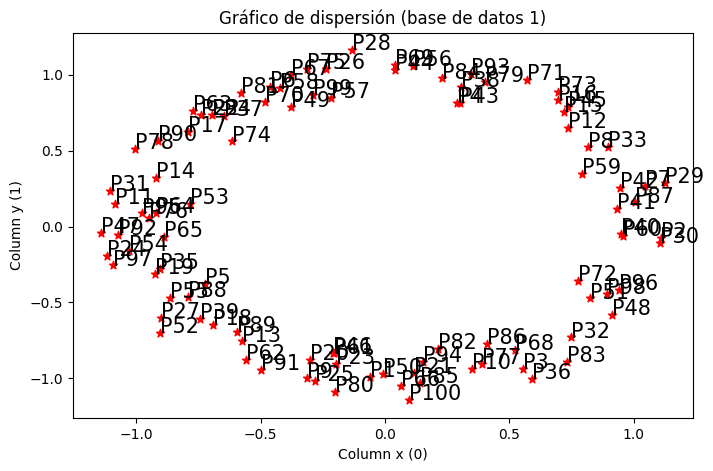

In [53]:
plt.figure(figsize=(8,5))
plt.scatter(data1['x'], data1['y'], c='r', marker='*')
plt.xlabel('Column x (0)')
plt.ylabel('Column y (1)')
plt.title('Gráfico de dispersión (base de datos 1)')
for j in data1.itertuples():
    plt.annotate(j.Index, (j.x, j.y), fontsize=15)

### Complejo de Rips

In [54]:
dist1 = pd.DataFrame(squareform(pdist(data1[['x','y']]), 'euclidean'), columns=data1.index.values, index=data1.index.values)
print('Diámetro de la base de datos 1: ', round(max(dist1.max())))

Diámetro de la base de datos 1:  2


In [55]:
rips1 = gudhi.RipsComplex(points = data1_np, max_edge_length=2)

simplex_tree = rips1.create_simplex_tree(max_dimension=2)
result_str = 'Rips complex 1 is of dimension ' + repr(simplex_tree.dimension()) + ' | ' + repr(simplex_tree.num_simplices()) + ' simplices | ' + repr(simplex_tree.num_vertices()) + ' vertices'
print(result_str)
fmt = '%s -> %f'
for filtered_value in simplex_tree.get_filtration():
    print(fmt % tuple(filtered_value))

Rips complex 1 is of dimension 2 | 122305 simplices | 100 vertices
[0] -> 0.000000
[1] -> 0.000000
[2] -> 0.000000
[3] -> 0.000000
[4] -> 0.000000
[5] -> 0.000000
[6] -> 0.000000
[7] -> 0.000000
[8] -> 0.000000
[9] -> 0.000000
[10] -> 0.000000
[11] -> 0.000000
[12] -> 0.000000
[13] -> 0.000000
[14] -> 0.000000
[15] -> 0.000000
[16] -> 0.000000
[17] -> 0.000000
[18] -> 0.000000
[19] -> 0.000000
[20] -> 0.000000
[21] -> 0.000000
[22] -> 0.000000
[23] -> 0.000000
[24] -> 0.000000
[25] -> 0.000000
[26] -> 0.000000
[27] -> 0.000000
[28] -> 0.000000
[29] -> 0.000000
[30] -> 0.000000
[31] -> 0.000000
[32] -> 0.000000
[33] -> 0.000000
[34] -> 0.000000
[35] -> 0.000000
[36] -> 0.000000
[37] -> 0.000000
[38] -> 0.000000
[39] -> 0.000000
[40] -> 0.000000
[41] -> 0.000000
[42] -> 0.000000
[43] -> 0.000000
[44] -> 0.000000
[45] -> 0.000000
[46] -> 0.000000
[47] -> 0.000000
[48] -> 0.000000
[49] -> 0.000000
[50] -> 0.000000
[51] -> 0.000000
[52] -> 0.000000
[53] -> 0.000000
[54] -> 0.000000
[55] -> 

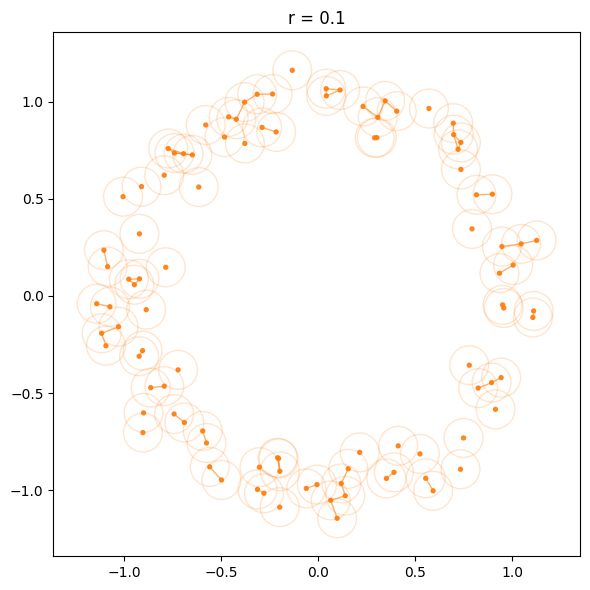

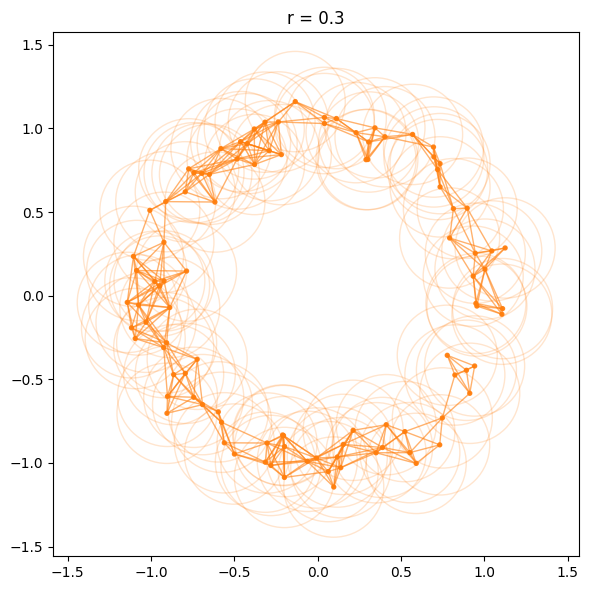

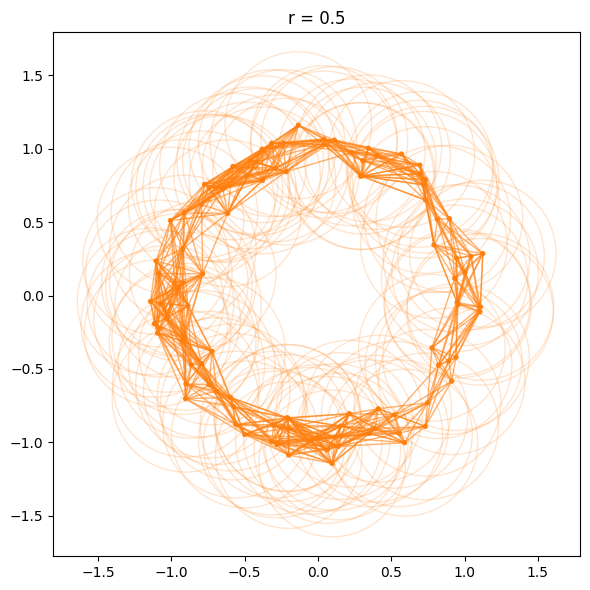

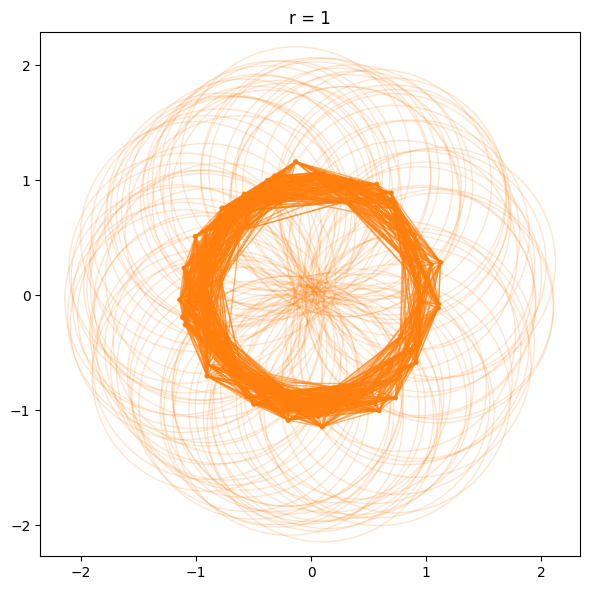

In [56]:
plot_rips_complex(data1_np, R=0.1, label='r = 0.1', maxdim=1)
plot_rips_complex(data1_np, R=0.3, label='r = 0.3', maxdim=1)
plot_rips_complex(data1_np, R=0.5, label='r = 0.5', maxdim=1)
plot_rips_complex(data1_np, R=1, label='r = 1', maxdim=1)

### Complejo de Alpha

In [57]:
alpha1 = gudhi.AlphaComplex(points = data1_np)

simplex_tree = alpha1.create_simplex_tree()
result_str = 'Alpha complex is of dimension ' + repr(simplex_tree.dimension()) + ' | ' + repr(simplex_tree.num_simplices()) + ' simplices | ' + repr(simplex_tree.num_vertices()) + ' vertices'
print(result_str)
fmt = '%s -> %f'
for filtered_value in simplex_tree.get_filtration():
    print(fmt % tuple(filtered_value))

Alpha complex is of dimension 2 | 557 simplices | 100 vertices
[0] -> 0.000000
[1] -> 0.000000
[2] -> 0.000000
[3] -> 0.000000
[4] -> 0.000000
[5] -> 0.000000
[6] -> 0.000000
[7] -> 0.000000
[8] -> 0.000000
[9] -> 0.000000
[10] -> 0.000000
[11] -> 0.000000
[12] -> 0.000000
[13] -> 0.000000
[14] -> 0.000000
[15] -> 0.000000
[16] -> 0.000000
[17] -> 0.000000
[18] -> 0.000000
[19] -> 0.000000
[20] -> 0.000000
[21] -> 0.000000
[22] -> 0.000000
[23] -> 0.000000
[24] -> 0.000000
[25] -> 0.000000
[26] -> 0.000000
[27] -> 0.000000
[28] -> 0.000000
[29] -> 0.000000
[30] -> 0.000000
[31] -> 0.000000
[32] -> 0.000000
[33] -> 0.000000
[34] -> 0.000000
[35] -> 0.000000
[36] -> 0.000000
[37] -> 0.000000
[38] -> 0.000000
[39] -> 0.000000
[40] -> 0.000000
[41] -> 0.000000
[42] -> 0.000000
[43] -> 0.000000
[44] -> 0.000000
[45] -> 0.000000
[46] -> 0.000000
[47] -> 0.000000
[48] -> 0.000000
[49] -> 0.000000
[50] -> 0.000000
[51] -> 0.000000
[52] -> 0.000000
[53] -> 0.000000
[54] -> 0.000000
[55] -> 0.00

## Base de datos 2

In [58]:
point_list = []
x = []
y = []

for n in range(len(data2_np)):
    point_list.append(('P' + str(n+1)))
    x.append(data2_np[n,0])
    y.append(data2_np[n,1])

data2 = pd.DataFrame({'Point': point_list, 'x':x, 'y':y})
data2 = data2.set_index('Point')

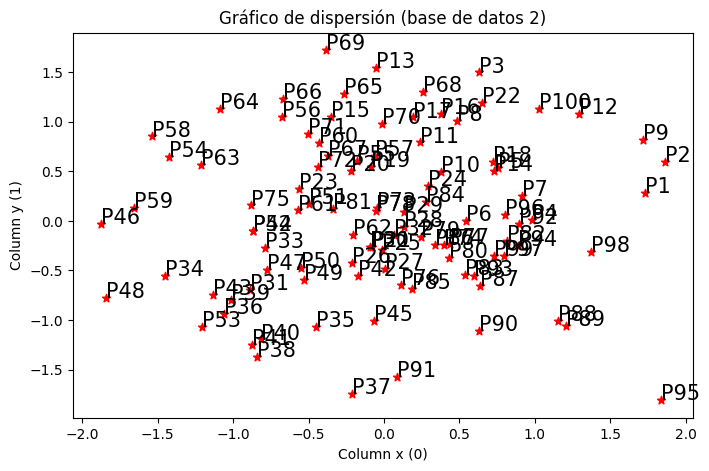

In [59]:
plt.figure(figsize=(8,5))
plt.scatter(data2['x'], data2['y'], c='r', marker='*')
plt.xlabel('Column x (0)')
plt.ylabel('Column y (1)')
plt.title('Gráfico de dispersión (base de datos 2)')
for j in data2.itertuples():
    plt.annotate(j.Index, (j.x, j.y), fontsize=15)

### Complejo de Rips

In [60]:
dist2 = pd.DataFrame(squareform(pdist(data2[['x', 'y']]), 'euclidean'), columns=data2.index.values, index=data2.index.values)
print('Diámetro de la base de datos 2: ', round(max(dist2.max())))

Diámetro de la base de datos 2:  4


In [61]:
rips2 = gudhi.RipsComplex(points = data2_np, max_edge_length=4)

simplex_tree = rips2.create_simplex_tree(max_dimension=2)
result_str = 'Rips complex 1 is of dimension ' + repr(simplex_tree.dimension()) + ' | ' + repr(simplex_tree.num_simplices()) + ' simplices | ' + repr(simplex_tree.num_vertices()) + ' vertices'
print(result_str)
fmt = '%s -> %f'
for filtered_value in simplex_tree.get_filtration():
    print(fmt % tuple(filtered_value))

Rips complex 1 is of dimension 2 | 166265 simplices | 100 vertices
[0] -> 0.000000
[1] -> 0.000000
[2] -> 0.000000
[3] -> 0.000000
[4] -> 0.000000
[5] -> 0.000000
[6] -> 0.000000
[7] -> 0.000000
[8] -> 0.000000
[9] -> 0.000000
[10] -> 0.000000
[11] -> 0.000000
[12] -> 0.000000
[13] -> 0.000000
[14] -> 0.000000
[15] -> 0.000000
[16] -> 0.000000
[17] -> 0.000000
[18] -> 0.000000
[19] -> 0.000000
[20] -> 0.000000
[21] -> 0.000000
[22] -> 0.000000
[23] -> 0.000000
[24] -> 0.000000
[25] -> 0.000000
[26] -> 0.000000
[27] -> 0.000000
[28] -> 0.000000
[29] -> 0.000000
[30] -> 0.000000
[31] -> 0.000000
[32] -> 0.000000
[33] -> 0.000000
[34] -> 0.000000
[35] -> 0.000000
[36] -> 0.000000
[37] -> 0.000000
[38] -> 0.000000
[39] -> 0.000000
[40] -> 0.000000
[41] -> 0.000000
[42] -> 0.000000
[43] -> 0.000000
[44] -> 0.000000
[45] -> 0.000000
[46] -> 0.000000
[47] -> 0.000000
[48] -> 0.000000
[49] -> 0.000000
[50] -> 0.000000
[51] -> 0.000000
[52] -> 0.000000
[53] -> 0.000000
[54] -> 0.000000
[55] -> 

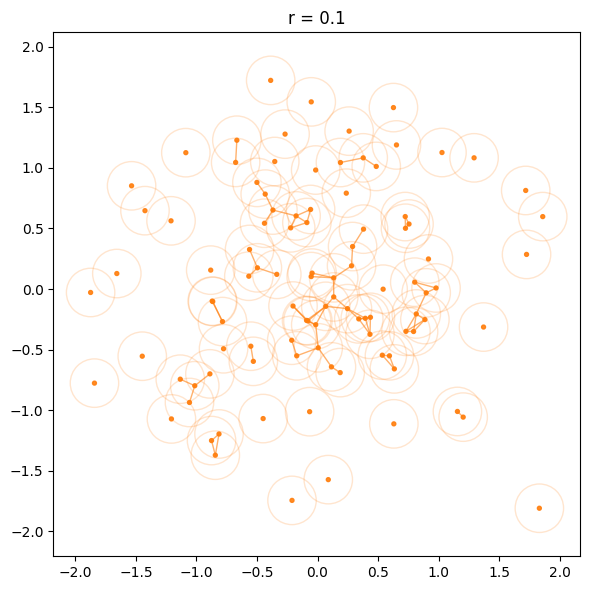

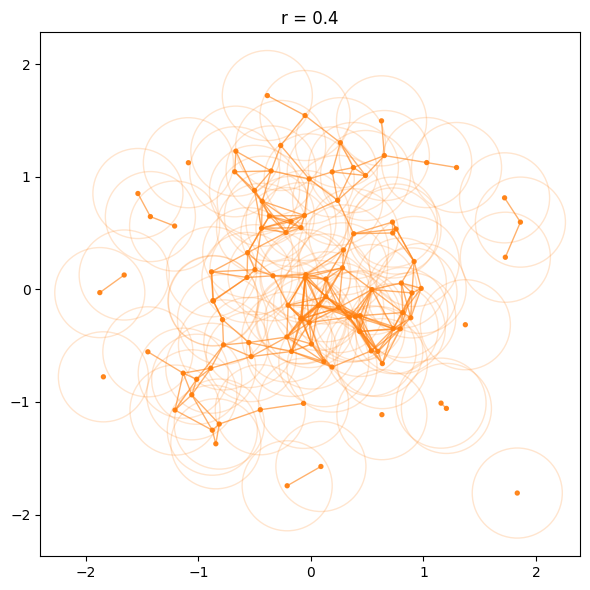

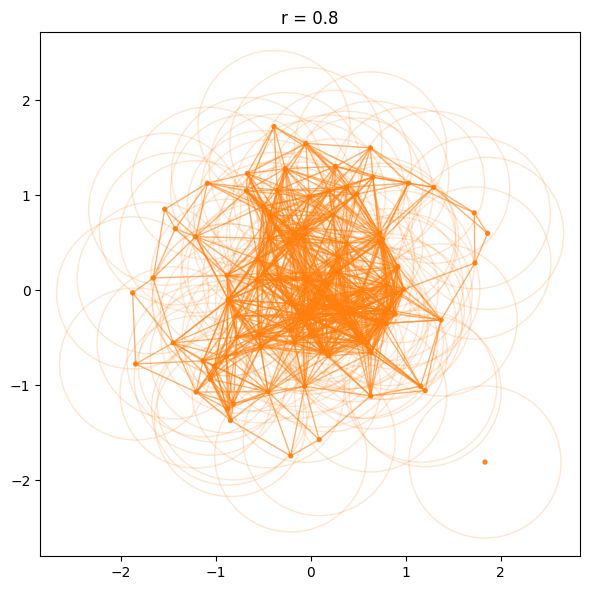

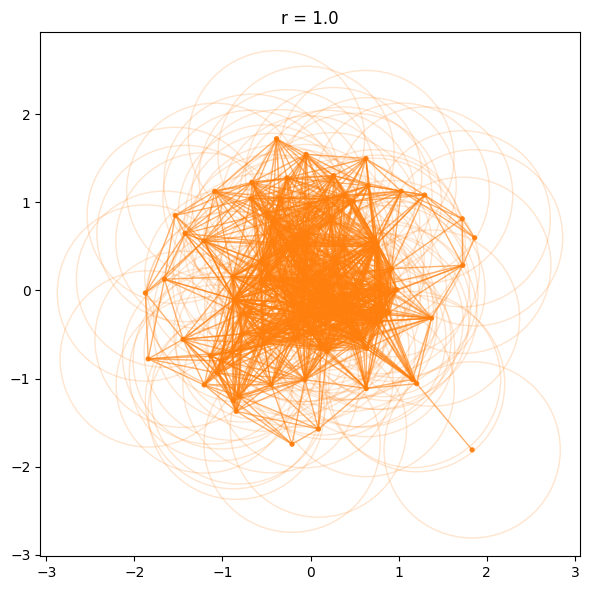

In [62]:
plot_rips_complex(data2_np, R=0.2, label='r = 0.1', maxdim=1)
plot_rips_complex(data2_np, R=0.4, label='r = 0.4', maxdim=1)
plot_rips_complex(data2_np, R=0.8, label='r = 0.8', maxdim=1)
plot_rips_complex(data2_np, R=1.0, label='r = 1.0', maxdim=1)

### Complejo de Alpha

In [63]:
alpha2 = gudhi.AlphaComplex(points = data2_np)

simplex_tree = alpha2.create_simplex_tree()
result_str = 'Alpha complex is of dimension ' + repr(simplex_tree.dimension()) + ' | ' + repr(simplex_tree.num_simplices()) + ' simplices | ' + repr(simplex_tree.num_vertices()) + ' vertices'
print(result_str)
fmt = '%s -> %f'
for filtered_value in simplex_tree.get_filtration():
    print(fmt % tuple(filtered_value))

Alpha complex is of dimension 2 | 573 simplices | 100 vertices
[0] -> 0.000000
[1] -> 0.000000
[2] -> 0.000000
[3] -> 0.000000
[4] -> 0.000000
[5] -> 0.000000
[6] -> 0.000000
[7] -> 0.000000
[8] -> 0.000000
[9] -> 0.000000
[10] -> 0.000000
[11] -> 0.000000
[12] -> 0.000000
[13] -> 0.000000
[14] -> 0.000000
[15] -> 0.000000
[16] -> 0.000000
[17] -> 0.000000
[18] -> 0.000000
[19] -> 0.000000
[20] -> 0.000000
[21] -> 0.000000
[22] -> 0.000000
[23] -> 0.000000
[24] -> 0.000000
[25] -> 0.000000
[26] -> 0.000000
[27] -> 0.000000
[28] -> 0.000000
[29] -> 0.000000
[30] -> 0.000000
[31] -> 0.000000
[32] -> 0.000000
[33] -> 0.000000
[34] -> 0.000000
[35] -> 0.000000
[36] -> 0.000000
[37] -> 0.000000
[38] -> 0.000000
[39] -> 0.000000
[40] -> 0.000000
[41] -> 0.000000
[42] -> 0.000000
[43] -> 0.000000
[44] -> 0.000000
[45] -> 0.000000
[46] -> 0.000000
[47] -> 0.000000
[48] -> 0.000000
[49] -> 0.000000
[50] -> 0.000000
[51] -> 0.000000
[52] -> 0.000000
[53] -> 0.000000
[54] -> 0.000000
[55] -> 0.00

## Base de datos 3

In [64]:
point_list = []
x = []
y = []

for n in range(len(data3_np)):
    point_list.append(('P' + str(n+1)))
    x.append(data3_np[n,0])
    y.append(data3_np[n,1])

data3 = pd.DataFrame({'Point': point_list, 'x':x, 'y':y})
data3 = data3.set_index('Point')

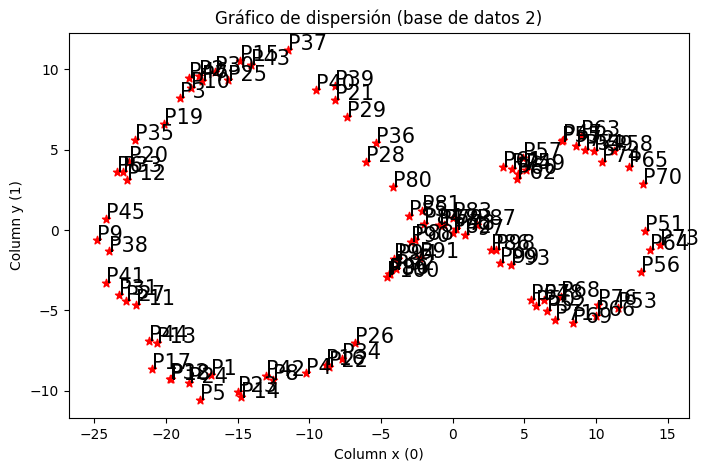

In [65]:
plt.figure(figsize=(8,5))
plt.scatter(data3['x'], data3['y'], c='r', marker='*')
plt.xlabel('Column x (0)')
plt.ylabel('Column y (1)')
plt.title('Gráfico de dispersión (base de datos 2)')
for j in data3.itertuples():
    plt.annotate(j.Index, (j.x, j.y), fontsize=15)

### Complejos de Rips

In [66]:
dist3 = pd.DataFrame(squareform(pdist(data3[['x', 'y']]), 'euclidean'), columns=data3.index.values, index=data3.index.values)
print('Diámetro de la base de datos 3: ', round(max(dist3.max())))

Diámetro de la base de datos 3:  39


In [67]:
rips3 = gudhi.RipsComplex(points = data3_np, max_edge_length=39)

simplex_tree = rips3.create_simplex_tree(max_dimension=2)
result_str = 'Rips complex 1 is of dimension ' + repr(simplex_tree.dimension()) + ' | ' + repr(simplex_tree.num_simplices()) + ' simplices | ' + repr(simplex_tree.num_vertices()) + ' vertices'
print(result_str)
fmt = '%s -> %f'
for filtered_value in simplex_tree.get_filtration():
    print(fmt % tuple(filtered_value))

Rips complex 1 is of dimension 2 | 166651 simplices | 100 vertices
[0] -> 0.000000
[1] -> 0.000000
[2] -> 0.000000
[3] -> 0.000000
[4] -> 0.000000
[5] -> 0.000000
[6] -> 0.000000
[7] -> 0.000000
[8] -> 0.000000
[9] -> 0.000000
[10] -> 0.000000
[11] -> 0.000000
[12] -> 0.000000
[13] -> 0.000000
[14] -> 0.000000
[15] -> 0.000000
[16] -> 0.000000
[17] -> 0.000000
[18] -> 0.000000
[19] -> 0.000000
[20] -> 0.000000
[21] -> 0.000000
[22] -> 0.000000
[23] -> 0.000000
[24] -> 0.000000
[25] -> 0.000000
[26] -> 0.000000
[27] -> 0.000000
[28] -> 0.000000
[29] -> 0.000000
[30] -> 0.000000
[31] -> 0.000000
[32] -> 0.000000
[33] -> 0.000000
[34] -> 0.000000
[35] -> 0.000000
[36] -> 0.000000
[37] -> 0.000000
[38] -> 0.000000
[39] -> 0.000000
[40] -> 0.000000
[41] -> 0.000000
[42] -> 0.000000
[43] -> 0.000000
[44] -> 0.000000
[45] -> 0.000000
[46] -> 0.000000
[47] -> 0.000000
[48] -> 0.000000
[49] -> 0.000000
[50] -> 0.000000
[51] -> 0.000000
[52] -> 0.000000
[53] -> 0.000000
[54] -> 0.000000
[55] -> 

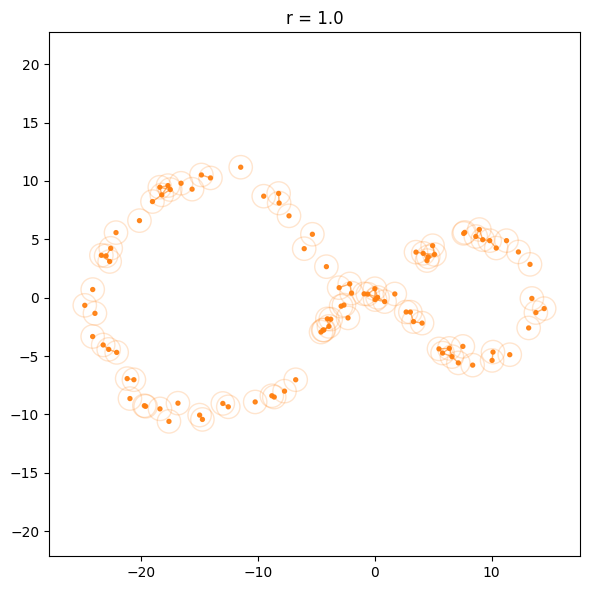

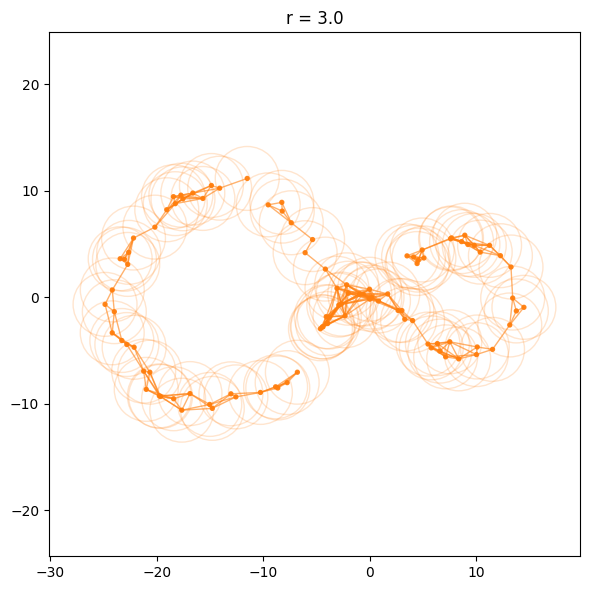

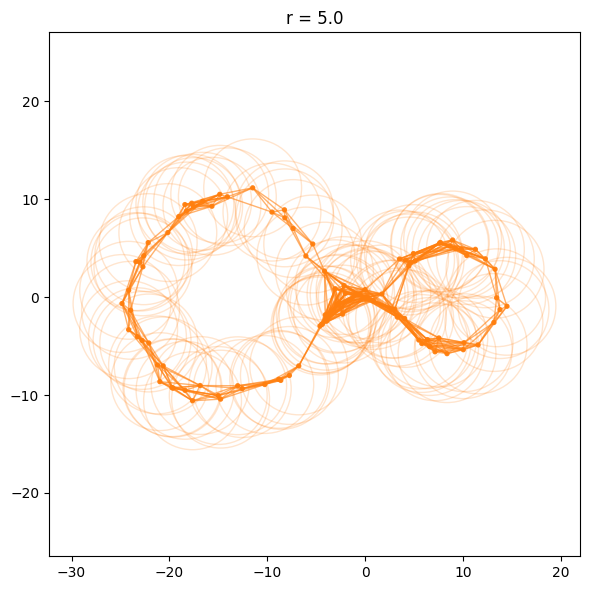

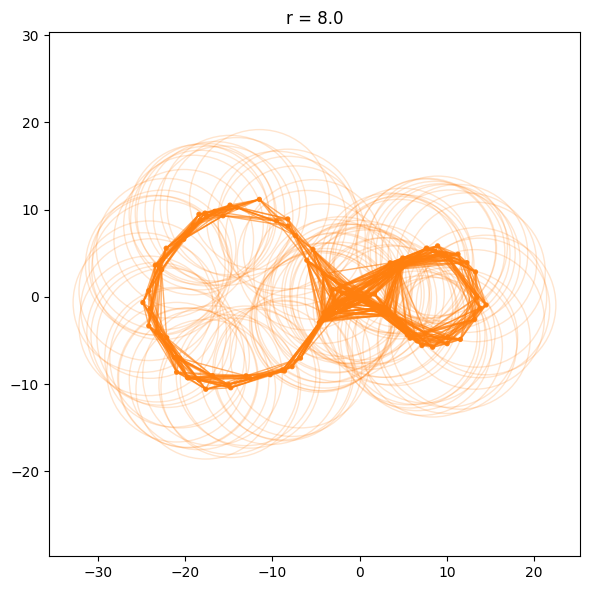

In [68]:
plot_rips_complex(data3_np, R=1.0, label='r = 1.0', maxdim=1)
plot_rips_complex(data3_np, R=3.0, label='r = 3.0', maxdim=1)
plot_rips_complex(data3_np, R=5.0, label='r = 5.0', maxdim=1)
plot_rips_complex(data3_np, R=8.0, label='r = 8.0', maxdim=1)

### Complejo de Alpha

In [69]:
alpha3 = gudhi.AlphaComplex(points = data3_np)

simplex_tree = alpha3.create_simplex_tree()
result_str = 'Alpha complex is of dimension ' + repr(simplex_tree.dimension()) + ' | ' + repr(simplex_tree.num_simplices()) + ' simplices | ' + repr(simplex_tree.num_vertices()) + ' vertices'
print(result_str)
fmt = '%s -> %f'
for filtered_value in simplex_tree.get_filtration():
    print(fmt % tuple(filtered_value))

Alpha complex is of dimension 2 | 559 simplices | 100 vertices
[0] -> 0.000000
[1] -> 0.000000
[2] -> 0.000000
[3] -> 0.000000
[4] -> 0.000000
[5] -> 0.000000
[6] -> 0.000000
[7] -> 0.000000
[8] -> 0.000000
[9] -> 0.000000
[10] -> 0.000000
[11] -> 0.000000
[12] -> 0.000000
[13] -> 0.000000
[14] -> 0.000000
[15] -> 0.000000
[16] -> 0.000000
[17] -> 0.000000
[18] -> 0.000000
[19] -> 0.000000
[20] -> 0.000000
[21] -> 0.000000
[22] -> 0.000000
[23] -> 0.000000
[24] -> 0.000000
[25] -> 0.000000
[26] -> 0.000000
[27] -> 0.000000
[28] -> 0.000000
[29] -> 0.000000
[30] -> 0.000000
[31] -> 0.000000
[32] -> 0.000000
[33] -> 0.000000
[34] -> 0.000000
[35] -> 0.000000
[36] -> 0.000000
[37] -> 0.000000
[38] -> 0.000000
[39] -> 0.000000
[40] -> 0.000000
[41] -> 0.000000
[42] -> 0.000000
[43] -> 0.000000
[44] -> 0.000000
[45] -> 0.000000
[46] -> 0.000000
[47] -> 0.000000
[48] -> 0.000000
[49] -> 0.000000
[50] -> 0.000000
[51] -> 0.000000
[52] -> 0.000000
[53] -> 0.000000
[54] -> 0.000000
[55] -> 0.00